In [1]:
import tensorflow as tf
import librys

print("TensorFlow version :", tf.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

TensorFlow version : 2.3.1
Num GPUs Available:  1


# Load Dataset and Overview

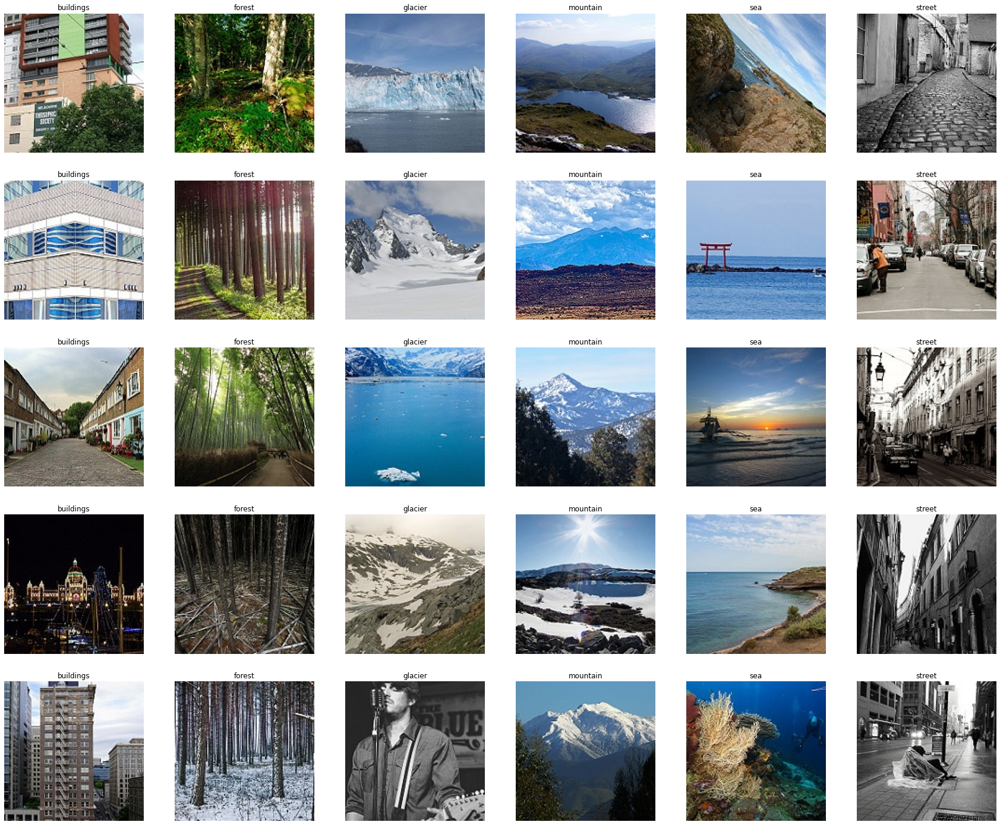

In [2]:
librys.trainSampleView()

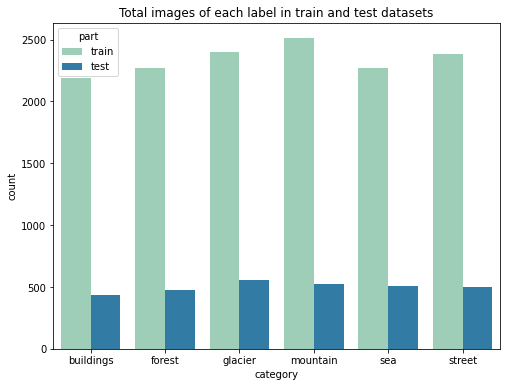

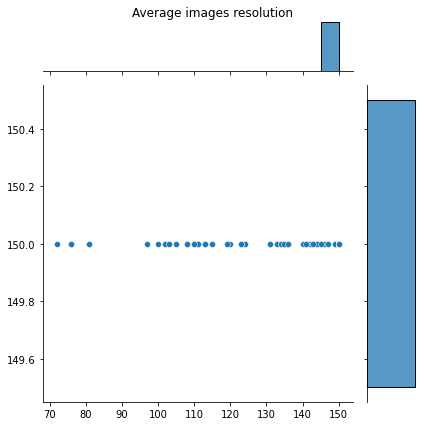

In [3]:
img_shape = librys.dataInfo(img_res=True)

# Images Preprocessing

In [4]:
param_augment = {"rotation_range":20,"width_shift_range":0.3,"height_shift_range":0.3,"shear_range":0.2,"brightness_range":(0.1,0.9),"zoom_range":[0.2,1.5],"channel_shift_range":150,"horizontal_flip":True,"fill_mode":'nearest'}

categories, total_categories, train_data, test_data, labels_dict = librys.dataPrep(image_shape=(img_shape[0],img_shape[1]),
                                                                                    color_mode='rgb',
                                                                                    batch_size=64,
                                                                                    class_mode='categorical',
                                                                                    image_augmentation=param_augment)

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


# Create The Model

In [5]:
model = librys.modeling(input_shape=img_shape, output_label=total_categories, verbose=True)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 147, 148, 256)     7168      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 145, 146, 128)     295040    
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 72, 73, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 70, 71, 64)        73792     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 35, 35, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 33, 33, 64)        36928     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 16, 16, 64)        0

In [6]:
model, history = librys.trainModel(model=model, data_train=train_data, data_validation=test_data, early_stop=True, num_epochs=100, verbose=1)

Epoch 1/100
219/219 [==============================] - 116s 528ms/step - loss: 1.4691 - accuracy: 0.4036 - val_loss: 1.1485 - val_accuracy: 0.5418
Epoch 2/100
219/219 [==============================] - 119s 542ms/step - loss: 1.3041 - accuracy: 0.4793 - val_loss: 1.0041 - val_accuracy: 0.6179
Epoch 3/100
219/219 [==============================] - 109s 499ms/step - loss: 1.2366 - accuracy: 0.5142 - val_loss: 0.9341 - val_accuracy: 0.6525
Epoch 4/100
219/219 [==============================] - 108s 494ms/step - loss: 1.1896 - accuracy: 0.5347 - val_loss: 0.8608 - val_accuracy: 0.6957
Epoch 5/100
219/219 [==============================] - 108s 491ms/step - loss: 1.1576 - accuracy: 0.5513 - val_loss: 0.9113 - val_accuracy: 0.6627
Epoch 6/100
219/219 [==============================] - 106s 484ms/step - loss: 1.1250 - accuracy: 0.5654 - val_loss: 0.8581 - val_accuracy: 0.6712
Epoch 7/100
219/219 [==============================] - 104s 474ms/step - loss: 1.1064 - accuracy: 0.5729 - val_loss: 0

# Evaluate The Model

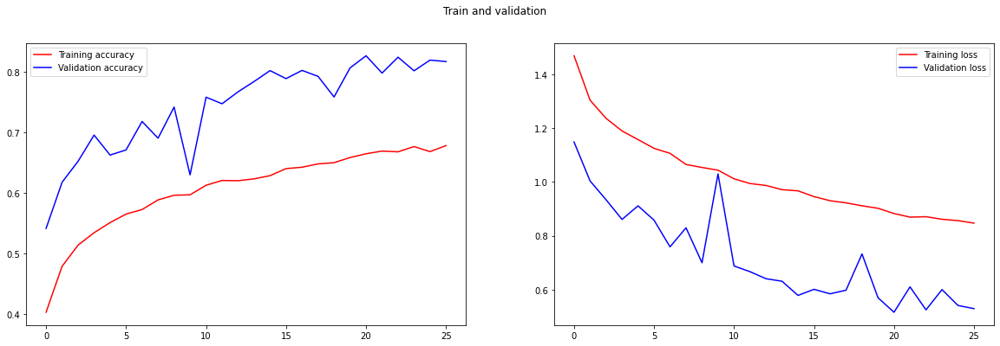

47/47 [==============================] - 5s 115ms/step - loss: 0.5340 - accuracy: 0.8150
validation accuracy : 81.49999976158142%
validation loss : 0.5340057015419006


In [7]:
librys.modelEvaluation(model=model, history=history, data_validation=test_data)

              precision    recall  f1-score   support

   buildings       0.73      0.85      0.78       437
      forest       0.89      0.98      0.93       474
     glacier       0.74      0.83      0.78       553
    mountain       0.81      0.78      0.79       525
         sea       0.91      0.64      0.75       510
      street       0.85      0.84      0.84       501

    accuracy                           0.81      3000
   macro avg       0.82      0.82      0.81      3000
weighted avg       0.82      0.81      0.81      3000





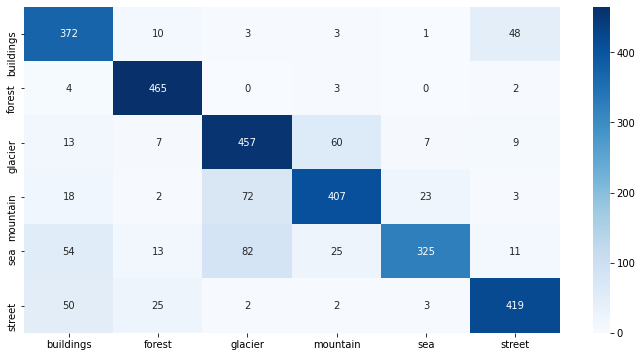

In [8]:
librys.modelReport(model=model, data_validation=test_data)

# Predict New Unlabeled Images

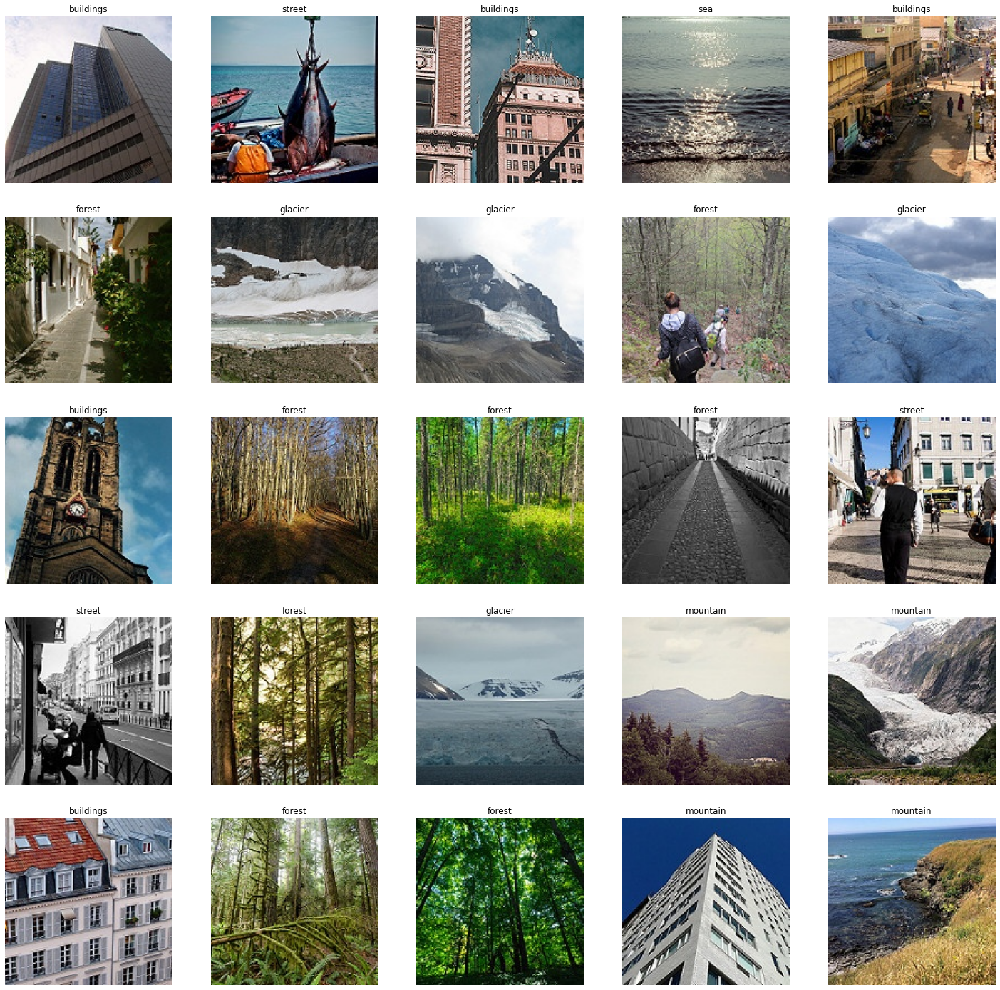

In [9]:
librys.predictNewImagesInBatch(model=model, categories_dict=labels_dict, image_shape=img_shape)